In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install -q roboflow
import torch
import os
from IPython.display import Image, clear_output

Cloning into 'yolov5'...
remote: Enumerating objects: 16094, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16094 (delta 0), reused 4 (delta 0), pack-reused 16089
Receiving objects: 100% (16094/16094), 14.81 MiB | 22.77 MiB/s, done.
Resolving deltas: 100% (11019/11019), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 58.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6

In [4]:
!pip install roboflow
import roboflow

In [38]:
import pandas as pd

In [2]:
os.environ["DATASET_DIRECTORY"]="/content/datasets"

In [8]:

rf = roboflow.Roboflow(api_key="AIKqfOwCgn4ftGBuGXes")
project = rf.workspace("east-west-university-9frzq").project("kidney-stone-detection-wfjba")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Kidney-stone-detection-1 in yolov5pytorch:: 100%|██████████| 6822/6822 [00:01<00:00, 5219.93it/s]


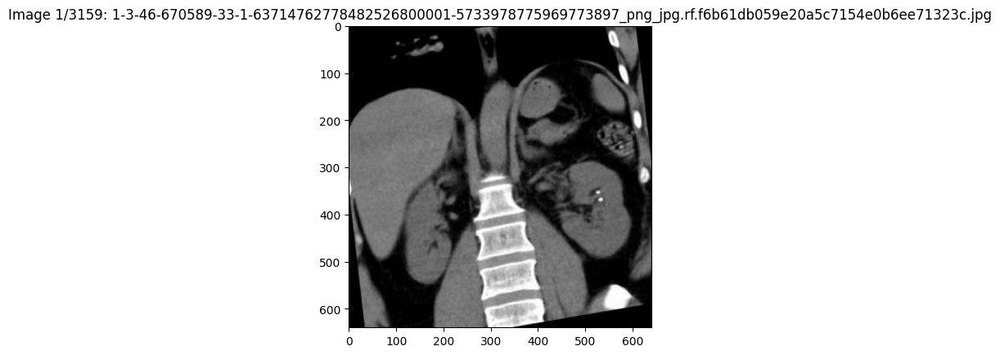

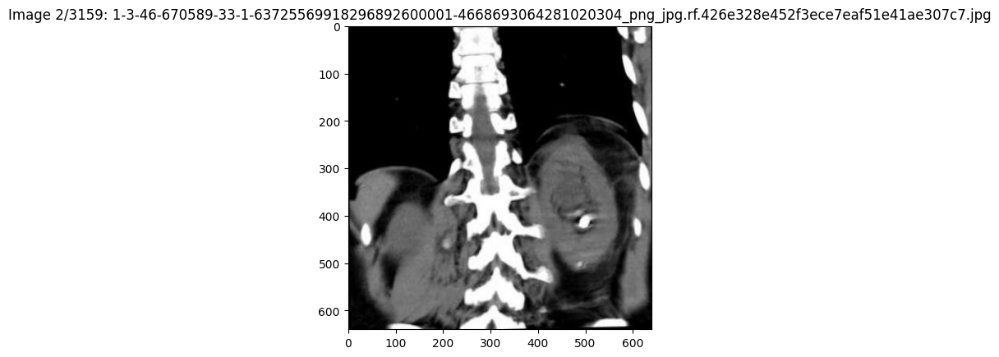

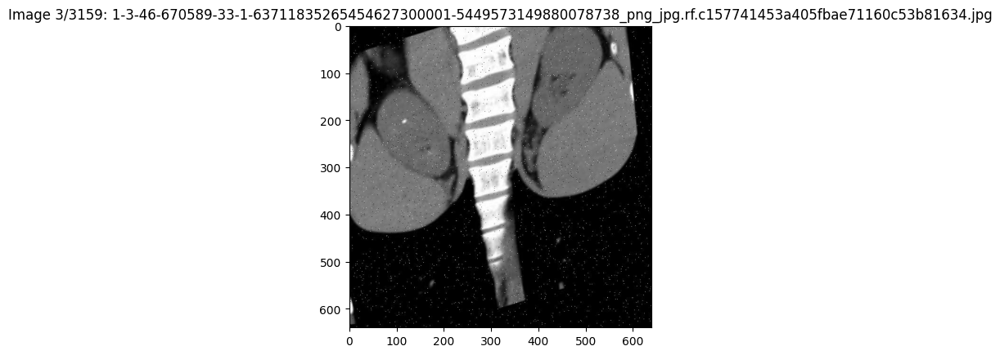

In [39]:
import os
import cv2
import matplotlib.pyplot as plt

# Chemin vers le répertoire contenant vos images
images_dir = "/content/datasets/Kidney-stone-detection-1/train/images"

# Liste des noms de fichiers d'images
image_files_list = os.listdir(images_dir)

# Afficher les images
num_images_to_display = 3

for i, image_file in enumerate(image_files_list[:num_images_to_display]):
    # Construire le chemin complet vers l'image
    image_path = os.path.join(images_dir, image_file)

    try:
        # Charger l'image avec OpenCV
        image = cv2.imread(image_path)

        # Convertir l'image de BGR à RGB (car OpenCV lit les images en BGR par défaut)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Afficher l'image
        plt.imshow(image_rgb)
        plt.title(f"Image {i+1}/{len(image_files_list)}: {image_file}")
        plt.show()
    except Exception as e:
        print(f"Erreur lors du chargement de l'image {image_file}: {e}")


In [45]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt

# Chemin vers le répertoire contenant vos images
train_path = "/content/datasets/Kidney-stone-detection-1/train/images"

# Chemin vers le répertoire contenant les labels YOLO
labels_path = "/content/datasets/Kidney-stone-detection-1/train/labels"

# Initialiser un DataFrame pour stocker les données
data = pd.DataFrame(columns=['image_id', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max'])

# Parcourir les images dans le répertoire d'entraînement
for k in os.listdir(train_path):
    # Charger l'image avec OpenCV
    img = cv2.imread(os.path.join(train_path, k))

    # Charger les annotations YOLO
    label = pd.read_csv(os.path.join(labels_path, k.replace(".jpg", '.txt')), delim_whitespace=True,
                        names=['class_id', 'x_center', 'y_center', 'width', 'height'], header=None)

    # Convertir les coordonnées YOLO en coordonnées COCO
    label['x_min'] = (label['x_center'] - label['width'] / 2) * img.shape[1]
    label['y_min'] = (label['y_center'] - label['height'] / 2) * img.shape[0]
    label['x_max'] = (label['x_center'] + label['width'] / 2) * img.shape[1]
    label['y_max'] = (label['y_center'] + label['height'] / 2) * img.shape[0]

    # Ajouter le nom de l'image à la DataFrame
    label['image_id'] = k.replace(".jpg", '')

    # Concaténer les données
    data = pd.concat([data, label])

# Afficher le DataFrame
data

,image_id,class_id,x_min,y_min,x_max,y_max,x_center,y_center,width,height
0,1-3-46-670589-33-1-63714762778482526800001-573...,0,521.250000,344.000000,532.750000,362.000000,0.823438,0.551562,0.017969,0.028125
1,1-3-46-670589-33-1-63714762778482526800001-573...,0,524.750000,362.000000,539.250000,374.000000,0.831250,0.575000,0.022656,0.018750
0,1-3-46-670589-33-1-63725569918296892600001-466...,0,481.250000,392.000000,510.750000,432.000000,0.775000,0.643750,0.046094,0.062500
1,1-3-46-670589-33-1-63725569918296892600001-466...,0,474.500000,491.000000,502.500000,515.000000,0.763281,0.785937,0.043750,0.037500
0,1-3-46-670589-33-1-63711835265454627300001-544...,0,112.551782,195.441051,134.184367,216.839588,0.192763,0.322094,0.033801,0.033435
...,...,...,...,...,...,...,...,...,...,...
0,1-3-46-670589-33-1-63735687503385145100001-494...,0,149.766513,468.690492,167.855922,486.284145,0.248143,0.746074,0.028265,0.027490
1,1-3-46-670589-33-1-63735687503385145100001-494...,0,163.003466,480.627002,174.708378,492.011130,0.263837,0.759874,0.018289,0.017788
2,1-3-46-670589-33-1-63735687503385145100001-494...,0,150.823881,485.190492,165.528793,496.679383,0.247151,0.767086,0.022976,0.017951
0,1-3-46-670589-33-1-63737665951748103300001-546...,0,100.156006,296.816380,134.669052,350.353380,0.183457,0.505601,0.053927,0.083652


In [44]:
data.tail(10)

,image_id,class_id,x_min,y_min,x_max,y_max,x_center,y_center,width,height
0,1-3-46-670589-33-1-63736564729016079600001-520...,0,458.941178,192.397947,494.709201,238.232220,0.745039,0.336430,0.055888,0.071616
0,1-3-46-670589-33-1-63735367673995813200001-536...,0,534.762236,456.280537,569.351364,497.009994,0.862589,0.744758,0.054046,0.063640
0,1-3-46-670589-33-1-63705605058116365300001-471...,0,77.195316,445.185126,94.806519,460.382939,0.134376,0.707475,0.027518,0.023747
0,1-3-46-670589-33-1-63711492298853059500001-493...,0,150.071918,260.823178,185.676993,313.434105,0.262304,0.448639,0.055633,0.082205
0,1-3-46-670589-33-1-63713051261240809900001-559...,0,39.393695,390.486606,103.495001,457.981208,0.111632,0.662865,0.100158,0.105460
0,1-3-46-670589-33-1-63735687503385145100001-494...,0,149.766513,468.690492,167.855922,486.284145,0.248143,0.746074,0.028265,0.027490
1,1-3-46-670589-33-1-63735687503385145100001-494...,0,163.003466,480.627002,174.708378,492.011130,0.263837,0.759874,0.018289,0.017788
2,1-3-46-670589-33-1-63735687503385145100001-494...,0,150.823881,485.190492,165.528793,496.679383,0.247151,0.767086,0.022976,0.017951
0,1-3-46-670589-33-1-63737665951748103300001-546...,0,100.156006,296.816380,134.669052,350.353380,0.183457,0.505601,0.053927,0.083652
0,1-3-46-670589-33-1-63731611371920091900001-517...,0,155.662068,329.000000,183.001665,352.000000,0.264581,0.532031,0.042718,0.035937


In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6831 entries, 0 to 0
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image_id  6831 non-null   object 
 1   class_id  6831 non-null   object 
 2   x_min     6831 non-null   float64
 3   y_min     6831 non-null   float64
 4   x_max     6831 non-null   float64
 5   y_max     6831 non-null   float64
 6   x_center  6831 non-null   float64
 7   y_center  6831 non-null   float64
 8   width     6831 non-null   float64
 9   height    6831 non-null   float64
dtypes: float64(8), object(2)
memory usage: 587.0+ KB


In [47]:
data['class_id'].unique()

array([0], dtype=object)

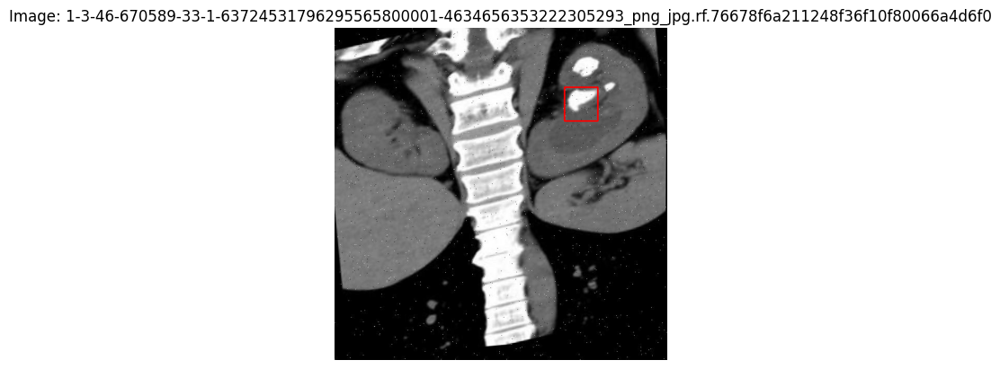

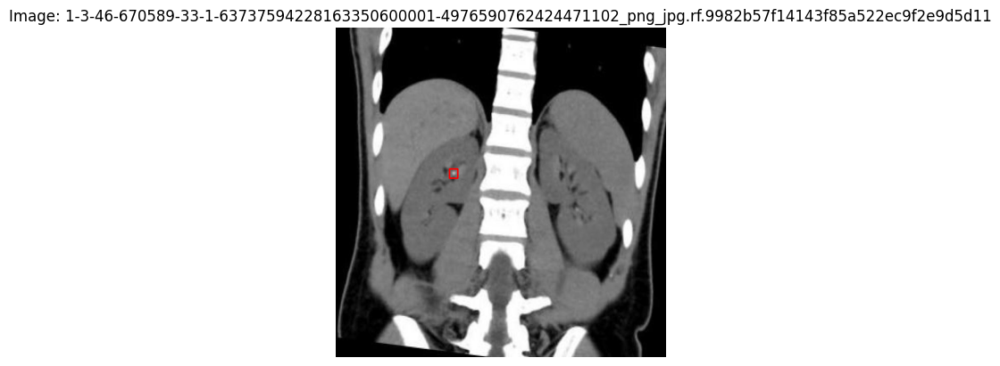

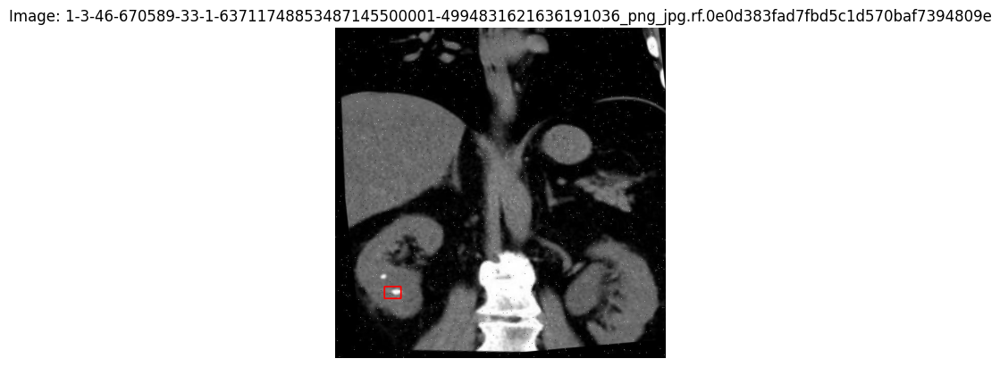

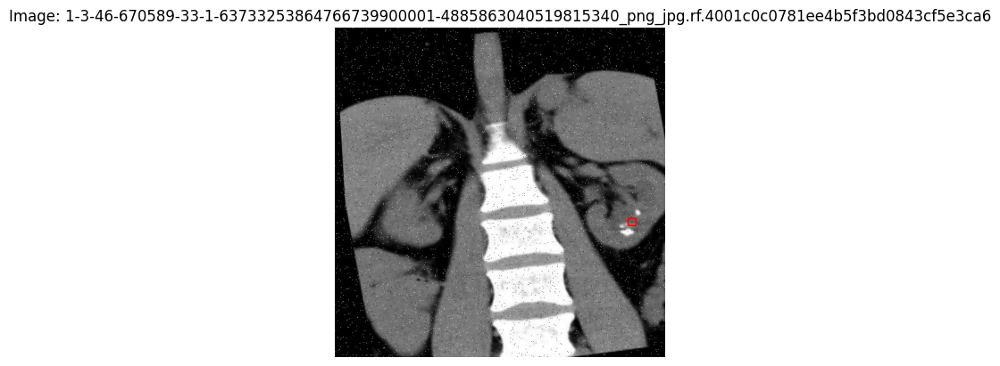

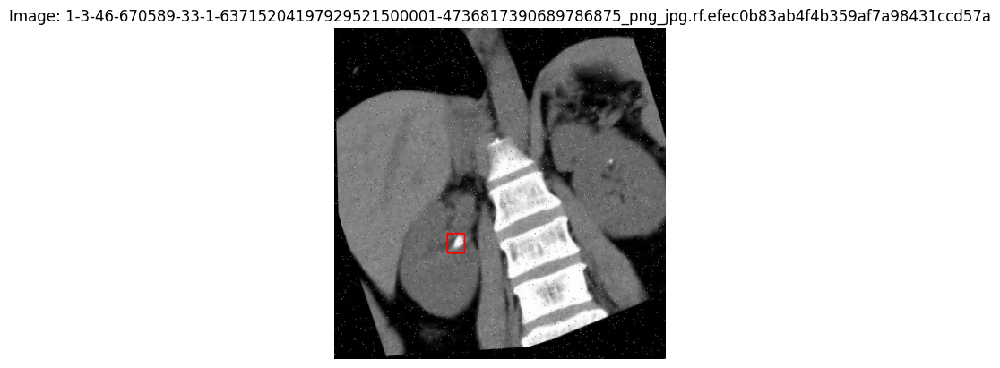

In [48]:
# Sélectionner quelques images pour l'affichage
images_to_display = 5
sample_data = data.sample(n=images_to_display)

# Afficher les images avec les annotations
for index, row in sample_data.iterrows():
    image_path = os.path.join(train_path, f"{row['image_id']}.jpg")
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Dessiner la boîte annotée
    x_min, y_min, x_max, y_max = int(row['x_min']), int(row['y_min']), int(row['x_max']), int(row['y_max'])
    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

    # Afficher l'image
    plt.imshow(image)
    plt.title(f"Image: {row['image_id']}")
    plt.axis('off')
    plt.show()

In [49]:
kidney_classes = data['class_id'].value_counts()
kidney_classes

0    6831
Name: class_id, dtype: int64

In [50]:
# Train YOLOv5s on COCO128 for 3 epochs
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2023-12-15 13:54:46.144252: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-15 13:54:46.144314: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-15 13:54:46.145681: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/Kidney-stone-detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=S

In [53]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [55]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source /content/datasets/Kidney-stone-detection-1/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/Kidney-stone-detection-1/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-249-gf400bba Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/123 /content/datasets/Kidney-stone-detection-1/valid/images/1-3-46-670589-33-1-63703718086220125900001-5014104694799407369_png_jpg.rf.d6efeb3ba1e288a6adc4ba3ee76cc129.jpg: 416x416 10 Tas_Vars, 7.1ms
image 2/123 /content/datasets/

In [76]:
# Exécutez les prédictions sur le dossier de test
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img-size 640 --conf 0.5 --source /content/datasets/Kidney-stone-detection-1/test/images --save-txt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/Kidney-stone-detection-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-249-gf400bba Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/123 /content/datasets/Kidney-stone-detection-1/test/images/1-3-46-670589-33-1-63703718086120120200001-5487554579919763006_png_jpg.rf.7393679d1d56ccf4f66c1293b97baae4.jpg: 640x640 3 Tas_Vars, 11.5ms
image 2/123 /content/datasets/Kidney-stone-detection-1/test/images/1-3-46-6

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/Kidney-stone-detection-1/test/images/1-3-46-670589-33-1-63739476574564149600001-5439781160937608718_png_jpg.rf.07654295384d2f089c788e4b32e637c2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-249-gf400bba Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/datasets/Kidney-stone-detection-1/test/images/1-3-46-670589-33-1-63739476574564149600001-5439781160937608718_png_jpg.rf.07654295384d2f089c788e4b32e637c

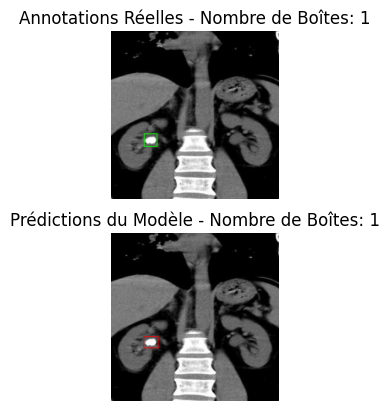

In [108]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Chemin vers le dossier de test
test_folder = '/content/datasets/Kidney-stone-detection-1/test'

# Choisir une image aléatoire du dossier de test
test_files = os.path.join(test_folder, 'images')
random_test_file = random.choice(os.listdir(test_files))

# Chemin vers l'image sélectionnée
image_path = os.path.join(test_files, random_test_file)

# Charger l'image avec OpenCV
image_test = cv2.imread(image_path)
image_test = cv2.cvtColor(image_test, cv2.COLOR_BGR2RGB)

# Charger les annotations réelles
annotations_path = os.path.join(test_folder, 'labels', random_test_file.replace('.jpg', '.txt'))

with open(annotations_path, 'r') as file:
    annotations_lines = file.readlines()

# Dessiner les boîtes de détection réelles sur l'image
for line in annotations_lines:
    class_id, x_center, y_center, width, height = map(float, line.strip().split())
    x_min = int((x_center - width / 2) * image_test.shape[1])
    y_min = int((y_center - height / 2) * image_test.shape[0])
    x_max = int((x_center + width / 2) * image_test.shape[1])
    y_max = int((y_center + height / 2) * image_test.shape[0])

    # Dessiner la boîte réelle en vert
    cv2.rectangle(image_test, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

# Affichage des annotations réelles
plt.subplot(2, 1, 1)
plt.imshow(image_test)
plt.axis('off')
plt.title(f"Annotations Réelles - Nombre de Boîtes: {len(annotations_lines)}")

# Réinitialiser l'image pour afficher les prédictions
image_test = cv2.imread(image_path)
image_test = cv2.cvtColor(image_test, cv2.COLOR_BGR2RGB)

# Exécuter les prédictions sur l'image sélectionnée
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img-size 640 --conf 0.5 --source {image_path} --save-txt

# Charger les annotations prédites
predicted_annotations_path = os.path.join('/content/yolov5/runs/detect/exp3/labels', random_test_file.replace('.jpg', '.txt'))

with open(predicted_annotations_path, 'r') as file:
    predicted_lines = file.readlines()

# Dessiner les boîtes de détection prédites sur l'image
for line in predicted_lines:
    class_id, x_center, y_center, width, height = map(float, line.strip().split())
    x_min = int((x_center - width / 2) * image_test.shape[1])
    y_min = int((y_center - height / 2) * image_test.shape[0])
    x_max = int((x_center + width / 2) * image_test.shape[1])
    y_max = int((y_center + height / 2) * image_test.shape[0])

    # Dessiner la boîte prédite en rouge
    cv2.rectangle(image_test, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

# Affichage des prédictions du modèle
plt.subplot(2, 1, 2)
plt.imshow(image_test)
plt.title(f"Prédictions du Modèle - Nombre de Boîtes: {len(predicted_lines)}")
plt.axis('off')

plt.show()
